---
#image: pandas.png
title: Data analytics workflow
subtitle: Data analysis example workbook
date: '2024-03-16'
categories: [pandas, seaborn, matplotlib, numpy]
author: Kunal Khurana
jupyter: python3
toc: True
---

In [ ]:
#!pip install calmap
!pip install ydata-profiling

#  1. Libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings as wrn

wrn.filterwarnings('ignore', category = DeprecationWarning) 
wrn.filterwarnings('ignore', category = FutureWarning) 
wrn.filterwarnings('ignore', category = UserWarning) 
#from pandas_profiling import ProfileReport

**Context**

1. Invoice ID: A unique identifier for each invoice or transaction.

2. Branch: The branch or location where the transaction occurred.

3. City: The city where the branch is located.

4. Customer Type: Indicates whether the customer is a regular or new customer.

5. Gender: The gender of the customer.

6. Product Line: The category or type of product purchased.

7. Unit Price: The price of a single unit of the product.

8. Quantity: The number of units of the product purchased.

9. Tax 5%: The amount of tax (5% of the total cost) applied to the transaction.

10. Total: The total cost of the transaction, including tax.

11. Date: The date when the transaction took place.

12. Time: The time of day when the transaction occurred.

13. Payment: The payment method used (e.g., credit card, cash).

14. COGS (Cost of Goods Sold): The direct costs associated with producing or purchasing the products sold.

15. Gross Margin Percentage: The profit margin percentage for the transaction.

16. Gross Income: The total profit earned from the transaction.

17. Rating: Customer satisfaction rating or feedback on the transaction.

For instance, if you were interested in predicting customer satisfaction, Rating might be a suitable label. If you were trying to predict sales or revenue, Total or Gross Income could be a potential label.

# 2. Initial Data Exploration

In [4]:
df = pd.read_csv("/kaggle/input/super-market-sales/supermarket_sales.csv")

In [5]:
df.head(10)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3
5,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,3/25/2019,18:30,Ewallet,597.73,4.761905,29.8865,4.1
6,355-53-5943,A,Yangon,Member,Female,Electronic accessories,68.84,6,20.6520,433.6920,2/25/2019,14:36,Ewallet,413.04,4.761905,20.6520,5.8
7,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,2/24/2019,11:38,Ewallet,735.60,4.761905,36.7800,8.0
8,665-32-9167,A,Yangon,Member,Female,Health and beauty,36.26,2,3.6260,76.1460,1/10/2019,17:15,Credit card,72.52,4.761905,3.6260,7.2
9,692-92-5582,B,Mandalay,Member,Female,Food and beverages,54.84,3,8.2260,172.7460,2/20/2019,13:27,Credit card,164.52,4.761905,8.2260,5.9


In [6]:
df.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating'],
      dtype='object')

In [7]:
df.dtypes

Invoice ID                  object
Branch                      object
City                        object
Customer type               object
Gender                      object
Product line                object
Unit price                 float64
Quantity                     int64
Tax 5%                     float64
Total                      float64
Date                        object
Time                        object
Payment                     object
cogs                       float64
gross margin percentage    float64
gross income               float64
Rating                     float64
dtype: object

In [8]:
df['Date'] = pd.to_datetime(df['Date'])

In [9]:
df.dtypes

Invoice ID                         object
Branch                             object
City                               object
Customer type                      object
Gender                             object
Product line                       object
Unit price                        float64
Quantity                            int64
Tax 5%                            float64
Total                             float64
Date                       datetime64[ns]
Time                               object
Payment                            object
cogs                              float64
gross margin percentage           float64
gross income                      float64
Rating                            float64
dtype: object

In [10]:
df.set_index("Date", inplace=True)

In [11]:
df.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000


# 3. Univariate Analysis

__Q1 What does the disribution of customer rating looks like? Is it skewed?__

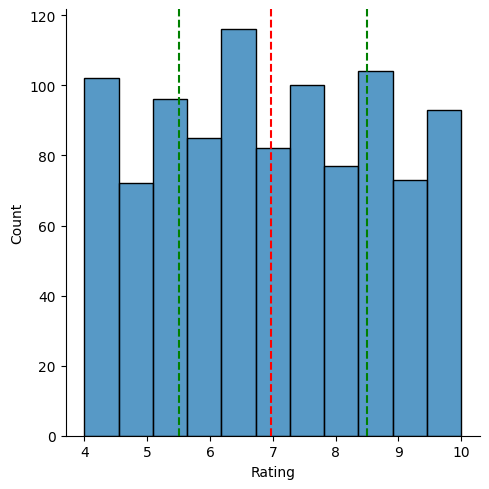

In [12]:
sns.displot(df["Rating"])
plt.axvline(x=np.mean(df["Rating"]), c='red', ls= "--")
plt.axvline(x=np.percentile(df["Rating"],25), c='green', ls= "--")
plt.axvline(x=np.percentile(df["Rating"],75), c='green', ls= "--")

array([[<Axes: title={'center': 'Unit price'}>,
        <Axes: title={'center': 'Quantity'}>,
        <Axes: title={'center': 'Tax 5%'}>],
       [<Axes: title={'center': 'Total'}>,
        <Axes: title={'center': 'cogs'}>,
        <Axes: title={'center': 'gross margin percentage'}>],
       [<Axes: title={'center': 'gross income'}>,
        <Axes: title={'center': 'Rating'}>, <Axes: >]], dtype=object)

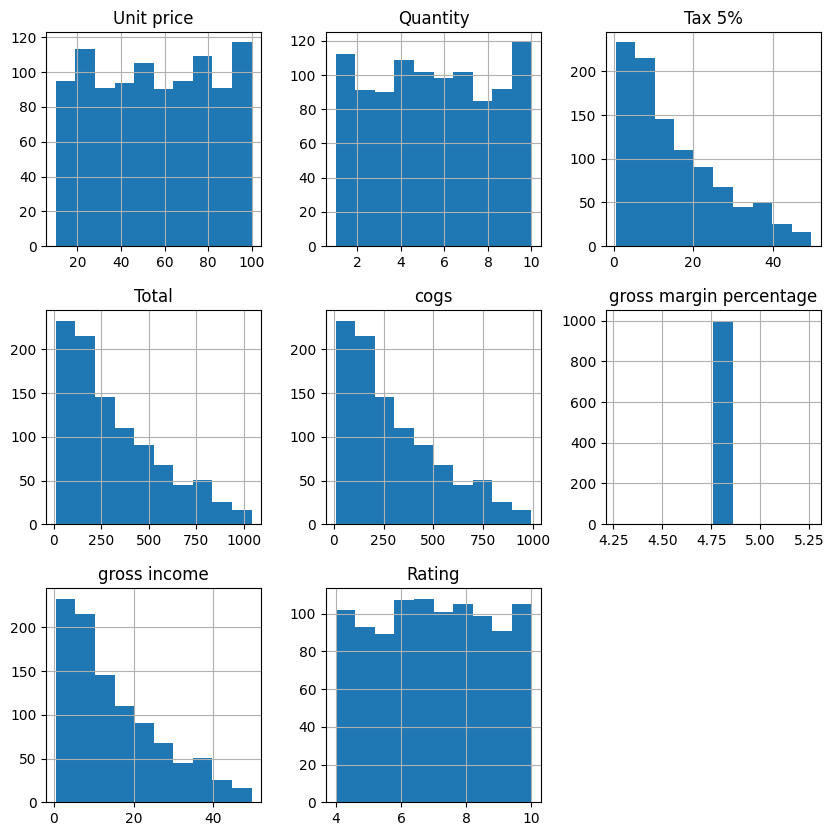

In [13]:
df.hist(figsize=(10,10))

In [14]:
df['Branch'].value_counts()

Branch
A    340
B    332
C    328
Name: count, dtype: int64

# 4. Bivariate analysis

In [15]:
#sns.countplot(df['Payment'])


<Axes: xlabel='Date', ylabel='Rating'>

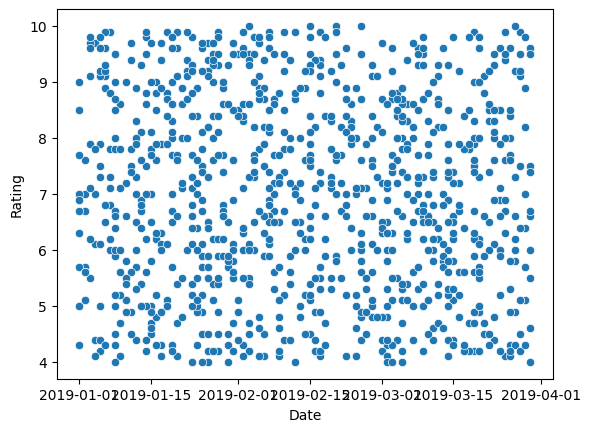

In [16]:
# comparison between two columns
sns.scatterplot(df['Rating'])

__Q2: is there a noticiable time trend in gross income?__

<Axes: xlabel='Branch', ylabel='gross income'>

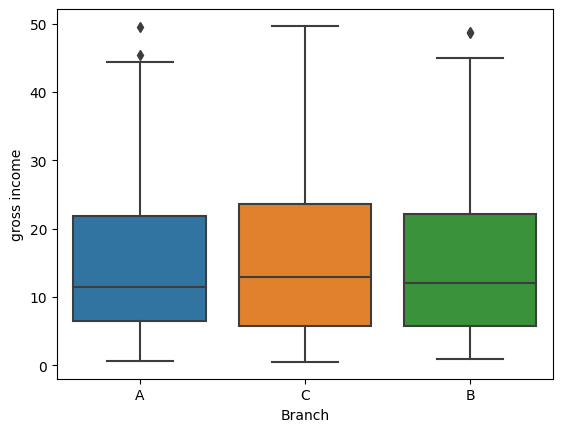

In [17]:
sns.boxplot(df, x='Branch', y='gross income')

<Axes: xlabel='Gender', ylabel='gross income'>

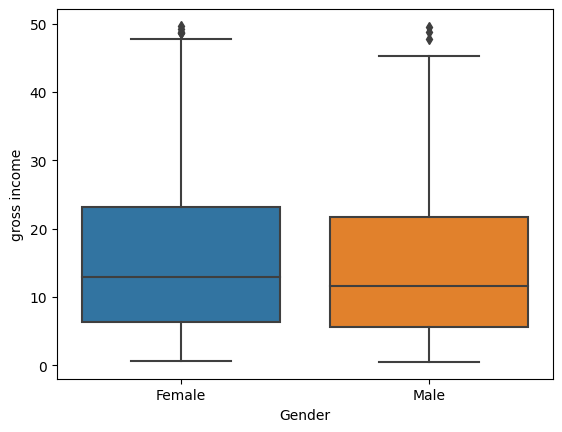

In [18]:
sns.boxplot(df, x="Gender", y="gross income")

In [19]:
df.groupby(by='gross income')

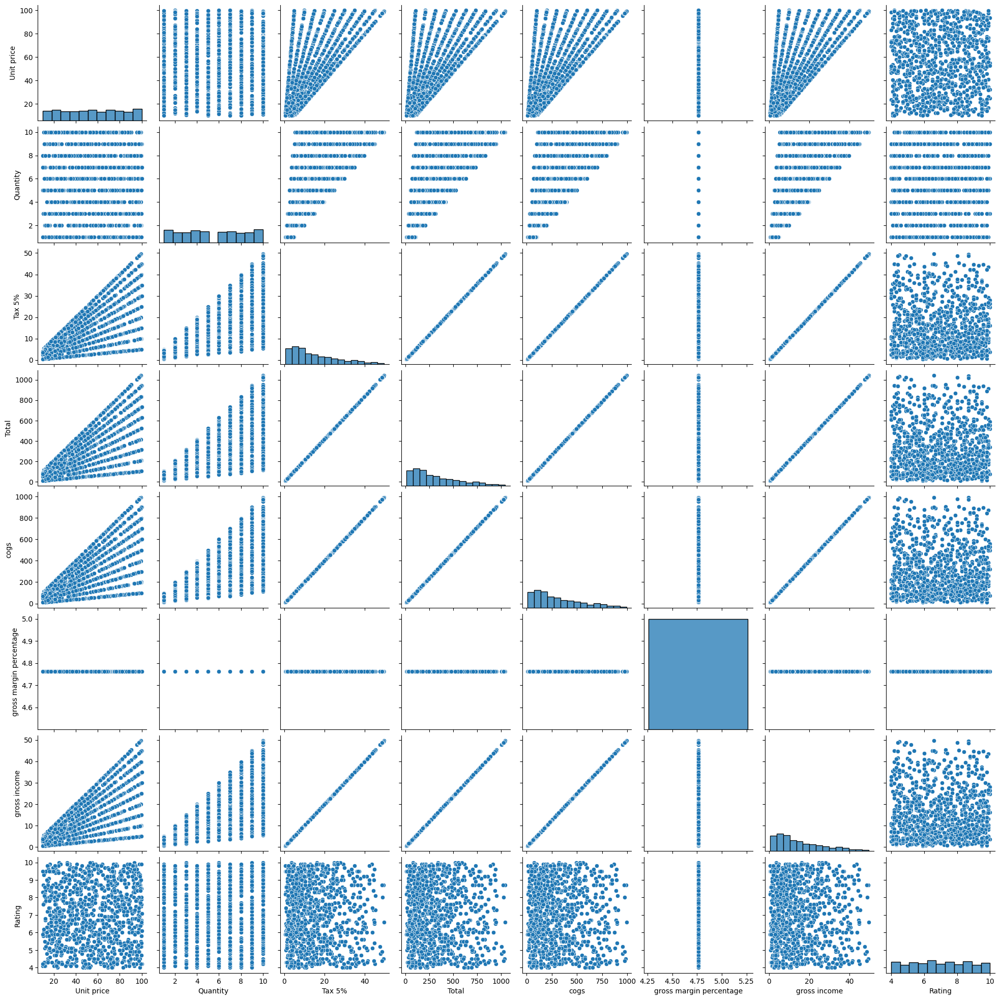

In [20]:
sns.pairplot(df)

# 5. Dealing with duplicate rows and missing values

In [21]:
df.duplicated()

Date
2019-01-05    False
2019-03-08    False
2019-03-03    False
2019-01-27    False
2019-02-08    False
              ...  
2019-01-29    False
2019-03-02    False
2019-02-09    False
2019-02-22    False
2019-02-18    False
Length: 1000, dtype: bool

In [22]:
df.duplicated().sum()

0

In [23]:
df.isna().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

<Axes: ylabel='Date'>

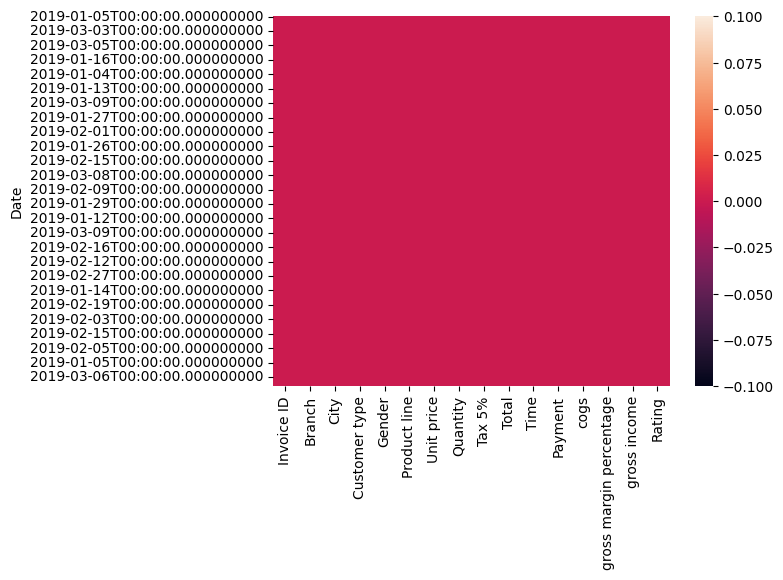

In [24]:
sns.heatmap(df.isnull())

In [25]:
df.mode()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,101-17-6199,A,Yangon,Member,Female,Fashion accessories,83.77,10.0,4.1540,87.2340,14:42,Ewallet,83.08,4.761905,4.1540,6.0
1,101-81-4070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.4640,93.7440,19:48,NaN,89.28,NaN,4.4640,NaN
2,102-06-2002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.3770,175.9170,NaN,NaN,167.54,NaN,8.3770,NaN
3,102-77-2261,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0045,189.0945,NaN,NaN,180.09,NaN,9.0045,NaN
4,105-10-6182,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.3260,216.8460,NaN,NaN,206.52,NaN,10.3260,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,894-41-5205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
996,895-03-6665,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
997,895-66-0685,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
998,896-34-0956,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
df.mode().iloc[0]

Invoice ID                         101-17-6199
Branch                                       A
City                                    Yangon
Customer type                           Member
Gender                                  Female
Product line               Fashion accessories
Unit price                               83.77
Quantity                                  10.0
Tax 5%                                   4.154
Total                                   87.234
Time                                     14:42
Payment                                Ewallet
cogs                                     83.08
gross margin percentage               4.761905
gross income                             4.154
Rating                                     6.0
Name: 0, dtype: object

# 6. Correlation analysis

In [27]:
np.corrcoef(df["gross income"], df['Rating'])

array([[ 1.       , -0.0364417],
       [-0.0364417,  1.       ]])

In [28]:
np.corrcoef(df["gross income"], df['Rating'])[1][0]

-0.03644170499701839

In [29]:
# rounding off
round(np.corrcoef(df['gross income'], df['Rating'])[1][0],2)

-0.04

# 7. Profiling

In [30]:
dataset = pd.read_csv("/kaggle/input/super-market-sales/supermarket_sales.csv")

from ydata_profiling import ProfileReport
profile = ProfileReport(dataset, title='Profiling Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 8. Resources

1. https://www.data-to-viz.com/ 
2. https://seaborn.pydata.org/examples/index.html 
3. https://pypi.org/project/pandas-profiling/ 